# Final Radio Project

Date: 5 Nov 2024

Name: Akshat Mishra

Partner's name: Saint Sachdev

### Picture of the final circuit: 
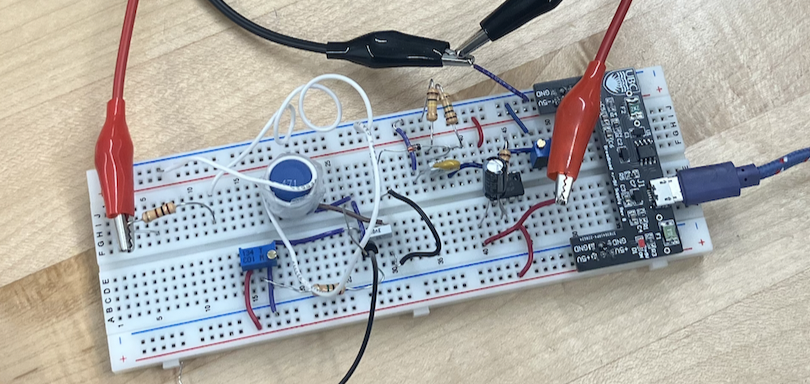
### Oscilloscope signal when the radio is tuned
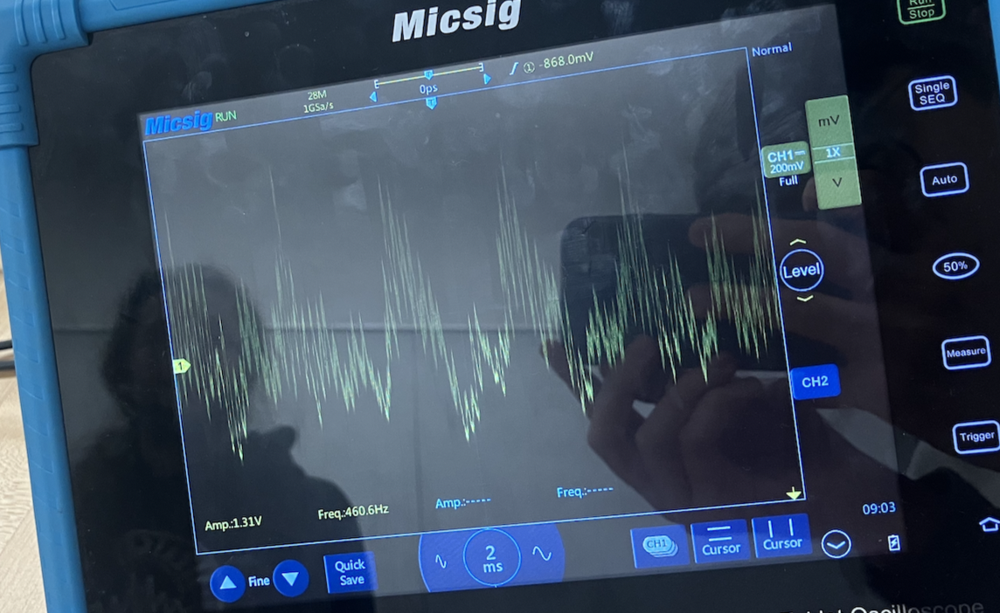

### The signal using tank circuit: 
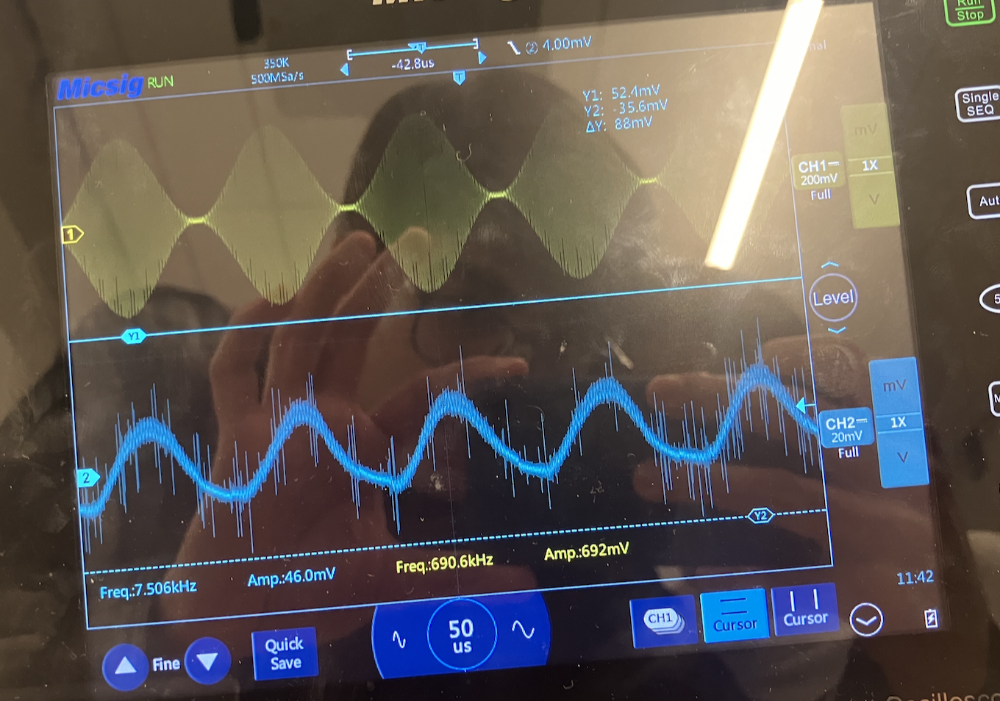

### The demodulator circuit 
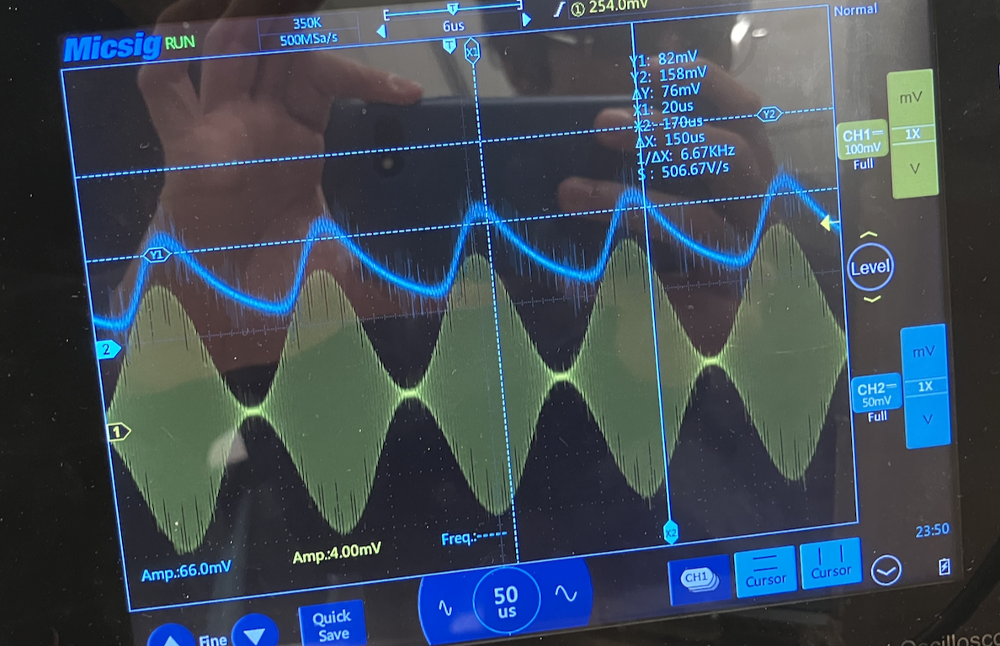

## Part-1: Amplifier

### DMM Measurements
- When we are trying to measure the 220uF capacitor, the value changes slowly from 200-206uF, and then it ends up at $206 \pm 4$ uF
- For the variable resistor, the max resistance is $9.48 \pm 0.09$kOhms
- We will set it to 2.5 kOhms later
- The resistance of the 1 Momhs resistor is: $0.987 \pm 0.148$ MOhms
- The capacitance of the 10 nF capacitor: $10.91 \pm 0.55$ nanoFarads 

- The capacitor between the amplifier and the demodulator stops the DC current
- the 1 MOhms resistor helps in removing the "Dc charge buildup"

The uncertainty was calculated after the lab
- Justifying uncertainty: Using the manual, we found out what percentage uncertainty there is. For example, in the 1 Mega Ohms range, the uncertainty is 1.5%, similarly, for the others

In [20]:
print(f"Uncertainty in 220uF capacitor is {0.02 * 206} uF")
print(f"Uncertainty in 10kOhms resitor is {0.01 * 9.48} kOhms")
print(f"Uncertainty in 1 MOhms resistor is {0.15 * 0.987} MOhms")
print(f"Uncertainty in 0.01 uF capacitor is {0.05 * 10.91} nF")

Uncertainty in 220uF capacitor is 4.12 uF
Uncertainty in 10kOhms resitor is 0.09480000000000001 kOhms
Uncertainty in 1 MOhms resistor is 0.14805 MOhms
Uncertainty in 0.01 uF capacitor is 0.5455 nF


### Building the circuit
- From our last circuit, we will check what all we need to change to convert to this week's circuit.
- First, we need to shift our circuit to the left, or else there won't be enough space for the rest of our radio
- we took a photo of the current circuit, and we will now shift it
- Now we shifted the whole circuit to the left (the place where the breadboard is powered)
- When we need to change R1 with the variable resistor.
- The resistance of the variable resistor: $2.495 \pm 0.2495$ kOhms
- We changed the resistor's screw again, because the 2.5kOhms was set between the wrong pair of legs
- Finally, the circuit looks correct.
- We also connected the 1Mohms resistor, and used a wire to connect a capacitor in series
- Now, we need to measure the V_in and V_out (to see the amplified
- NOw, prof Andreas is looking intently at our circuit and the oscilloscope

### Fixing the noise in the oscilloscpe: 
- First, we tuned on the low pass filter in channel-1 (the function generator input), and now the wave looks like a sine wave, but very noisy
- We made a mistake of grounding the middle leg of the variable resistor. so, we removed that
  (This mistake happend when we shifted the circuit to left, also now that we have a variable resistor, we got confused by it a littile)
- Perhaps the problem is tha tone of the wires is not properly inserted into the breadboard, so it looks like there is a connection, but there is no coonection? mayhaps
- Just to be clear, we do see both the yellow and the blue signal, the only problem is the noise. Crazy rich noise.
- Interestingly, removing the 1k ohms creates no difference in the circuit. Which is weird.
- Analogy: there is a piece of code. It behaves in a certain way. YOu remove a line of code, and the code still behaves exctlu the same, which shouldn't happen.
- Like, something should change, but it itsn't changin'
- Now we (by we, I mean Prof Andreas) is rebuilding the circuit bit by bit, and recheking each thing, using some nice debugging skills
- The problem is finally solved. The resistor which was connected as the feedback resisotor was connected to the wrong legs of the opAmp
- Phew!
- The gain is not what we expected (see the code cell below to see the difference between the expected and the actual value)
- But we just noticed another problem. The signal is not amplified. The input voltage is rediuced by a factor of 2. LIke what?
  Its supposed to be amplified, instead of de-amplification.
- The oscilloscope was set to "10x" for the input signal, hence the input was measuring 10 times the signal

### Finding the amplitude range
- We are trying to find the input amplitude range for which the output amplitude is undistorted
- So, at $1.5$ volts, the signal is definatly distorted/clipped
- At $1.420$ volts, the clipping starts

In [21]:
# This is the calculation of expected gain vs what we were getting
# The problem was that input in oscilloscope was set to 10x
print(f"gain should be: {9.48/2.495 + 1}")
print (f"But the gain is: {2.04/1.6 + 1}")

gain should be: 4.799599198396793
But the gain is: 2.275


### V_out vs V_in graph

In [22]:
import numpy as np
import pandas as pd

v_in_amplitude = np.array([1.4, 1.2, 1, 604e-3, 204e-3]) # volts
u_vin_amplitude = np.array([0.01, 0.01, 0.01, 0.01, 0.02]) # volts

amplified_amplitude = np.array([6.96, 5.96, 5.08, 2.98, 1.01]) # volts
u_amplifed_amplitude = np.array([0.04, 0.04, 0.04, 0.02, 0.01]) # volts 


# Create a dictionary where keys are column names and values are the arrays
data = {
    'v_in_amplitude': v_in_amplitude,
    'u_vin_amplitude': u_vin_amplitude,
    'amplified_amplitude': amplified_amplitude,
    'u_amplifed_amplitude': u_amplifed_amplitude,
}

# Convert the dictionary into a Pandas DataFrame
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
df.to_csv('data_voltages.csv', index=False)  # Set index=False to avoid adding an index column

print("CSV file created!")

CSV file created!


Slope is 4.976509244274435 +/- 0.015659061863013995

Goodness of fit - Chi-squared measure:
degrees of freedom = 4, Chi2/dof = 2.1873964003727147



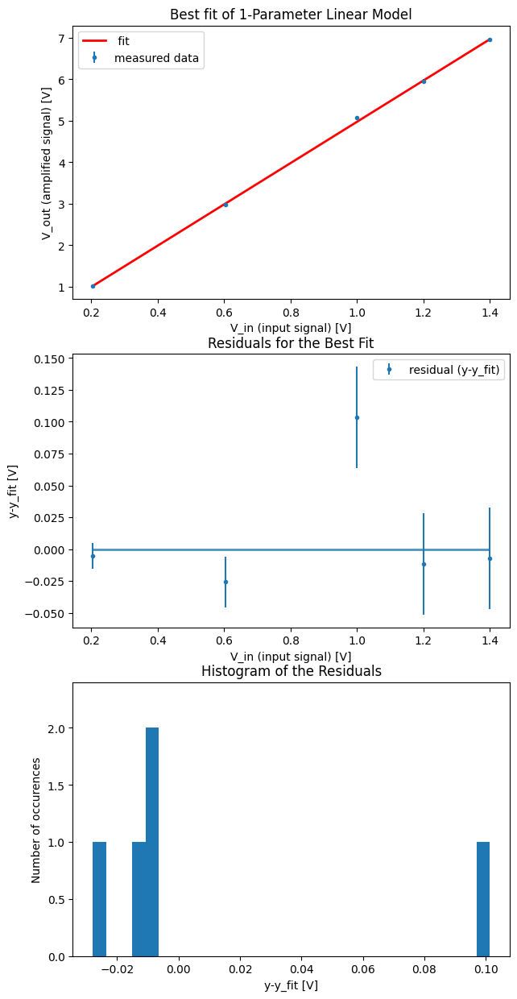

In [23]:
# The script below fits to a sine wave, but can be modified for other functions
# First, we load some python packages
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

################################################
# LIST OF ALL INPUTS
################################################

# fname is assumed to be in a four-column .csv file (comma separated values). The first two rows are
# assumed to be headers, like those produced in our code for packing oscilloscope data.
# The four columns are x-values, x-uncertainties, y-values, y-uncertainties.
# The .csv file must be in the same
# folder as this fit program, otherwise the full file extension must be added
# to fname: e.g. fname = 'folder/subfolder/subsubfolder/file.csv'

fname = "data_voltages.csv"

x_name = "V_in (input signal)"
x_units = "V"
y_name = "V_out (amplified signal)"
y_units = "V"

# The model you will fit to is defined below, in this case a sine wave.
# The parameters in the model are amplitude, freqency, and phase.
# To get a least squares fitting process started, it is necessary to provide good
# initial guesses for the parameters. From your plots of the data so far, you can make good guesses at these parameters.

param_names = ["slope"]


# definition of the fit function
# def fit_function(x, amplitude,tau):

# fit function is a linear model with slope and intercept

def fit_function(x, slope):
    return x*slope

# load the file "fname", defined above# load the file "fname", defined above; 
# if you have file with more than 4 columns, you may need to select different indicies for "usecols" (starting counting at 0)

data = np.loadtxt(fname, delimiter=",", comments="#", usecols=(0, 1, 2, 3), skiprows=1)

################################################
# READ IN DATA COLUMNS
################################################

# Here is where you access the data columns.
# You may need to alter these to choose what is on the y-axis and what is on the x-axis.

x = data[:, 0]
y = data[:, 2]
y_sigma = data[:, 3]

# calculate the best fit slope analytically (1-parameter solution)
m = sum(x*y/y_sigma**2)/sum((x/y_sigma)**2)

# calculate uncertainty of the best fit slope
m_sigma = np.sqrt(1/sum((x/y_sigma)**2))

print ("Slope is", m, "+/-", m_sigma)

###############################################################################
# calculates and prints the chi-squared, degrees of freedon, and weighted chi-squared
###############################################################################

# function that  calculates the chi square value of a fit
def chi_square (param1, x, y, sigma):
#
    return np.sum((y-fit_function(x, param1))**2/sigma**2)
    
# calculate and print chi square as well as the per degree-of-freedom value
chi2 = chi_square(m,x,y,y_sigma)
# degrees of freedom is the number of data points minus the number of parameters
dof = len(x) - 1
print ("\nGoodness of fit - Chi-squared measure:")
print ("degrees of freedom = {}, Chi2/dof = {}\n".format(dof, chi2/dof))


# residual is the difference between the data and model
x_fitfunc = np.linspace(min(x), max(x), 500)
y_fitfunc = fit_function(x_fitfunc, m)
y_fit = fit_function(x, m)
residual = y-y_fit
# creates a histogram of the residuals
hist,bins = np.histogram(residual,bins=30)

fig = plt.figure(figsize=(7,15))

ax1 = fig.add_subplot(311)
ax1.errorbar(x,y,yerr=y_sigma,marker='.',linestyle='',label="measured data")
ax1.plot(x_fitfunc,y_fitfunc,marker="",linestyle="-",linewidth=2,color="r",
         label=" fit")
# add axis labels and title
ax1.set_xlabel('{} [{}]'.format(x_name,x_units))
ax1.set_ylabel('{} [{}]'.format(y_name,y_units))
ax1.set_title('Best fit of 1-Parameter Linear Model')
# set the x and y boundaries of your plot
#plt.xlim(lower_x,upper_x)
#plt.ylim(lower_y,upper_y)
# show a legend. loc='best' places legend where least amount of data is 
# obstructed. 
ax1.legend(loc='best',numpoints=1)


# this code produces a figure with a plot of the residuals as well
# as a histogram of the residuals. 
# fig = plt.figure(figsize=(7,10))
ax2 = fig.add_subplot(312)
ax2.errorbar(x,residual,yerr=y_sigma,marker='.',linestyle='',
             label="residual (y-y_fit)")
ax2.hlines(0,np.min(x),np.max(x),lw=2,alpha=0.8)
ax2.set_xlabel('{} [{}]'.format(x_name,x_units))
ax2.set_ylabel('y-y_fit [{}]'.format(y_units))
ax2.set_title('Residuals for the Best Fit')
ax2.legend(loc='best',numpoints=1)
ax3 = fig.add_subplot(313)
ax3.bar(bins[:-1],hist,width=bins[1]-bins[0])

ax3.set_ylim(0,1.2*np.max(hist))
ax3.set_xlabel('y-y_fit [{}]'.format(y_units))
ax3.set_ylabel('Number of occurences')
ax3.set_title('Histogram of the Residuals')

"""
Modify the following lines to change the name of the file used to store a JPEG of your best fit graphs
"""

# Before showing the plot, you can also save a copy of the figure as a JPEG.
# The order is important here because plt.show clears the plot information after displaying it. 
plt.savefig('FittingResults.jpeg')
plt.show()

### Analysis of V_out vs V_in graph
- The graph is linear, as expected (becasue we found a range in which there is no distortion, hence linearity is expected)
- It looks like graph fits the data points well
- The gain is $4.97 \pm 0.02$, which is close to $4.8$ish, our expected gain
- There are more negative residuals than the positive ones, which can be improved by using a two parameter fit.
- Chi square is $2.18$, which is close to 1, hence our fit is a good fit. 

### Gain vs frequency graph

In [24]:
v_in_amplitude = np.array([204e-3, 202e-3, 202e-3, 202e-3, 202e-3, 190e-3, 168e-3, 140e-3, 124e-3]) # volts
u_vin_amplitude = np.array([0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.002, 0.002]) # volts

amplified_amplitude = np.array([1.01, 1.03, 1.01, 1.01, 1.01, 990e-3, 1.01, 920e-3, 870e-3]) # volts
u_amplifed_amplitude = np.array([0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01]) # volts 

gain = np.array(amplified_amplitude / v_in_amplitude)
print(gain)
u_gain = np.array([0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01])

freq = np.array([1, 5, 10, 15, 20, 50, 100, 150, 200]) # kHz
u_freq = np.array([0.004, 0.01, 0.01, 0.01, 0.07, 0.07, 0.3, 0.4, 0.3])

# Create a dictionary where keys are column names and values are the arrays
data = {
    'freq': freq,
    'u_freq': u_freq,
    'gain': gain,
    'u_gain': u_gain,
}

# Convert the dictionary into a Pandas DataFrame
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
df.to_csv('data_freq.csv', index=False)  # Set index=False to avoid adding an index column

print("CSV file created!")

[4.95098039 5.0990099  5.         5.         5.         5.21052632
 6.01190476 6.57142857 7.01612903]
CSV file created!


Slope is 0.010794635605809642 +/- 4.878480894568575e-05
Intercept is 4.879126083969636 +/- 0.004475664654992146

Goodness of fit - Chi-squared measure:
degrees of freedom = 7, Chi2/dof = 134.57845712772223



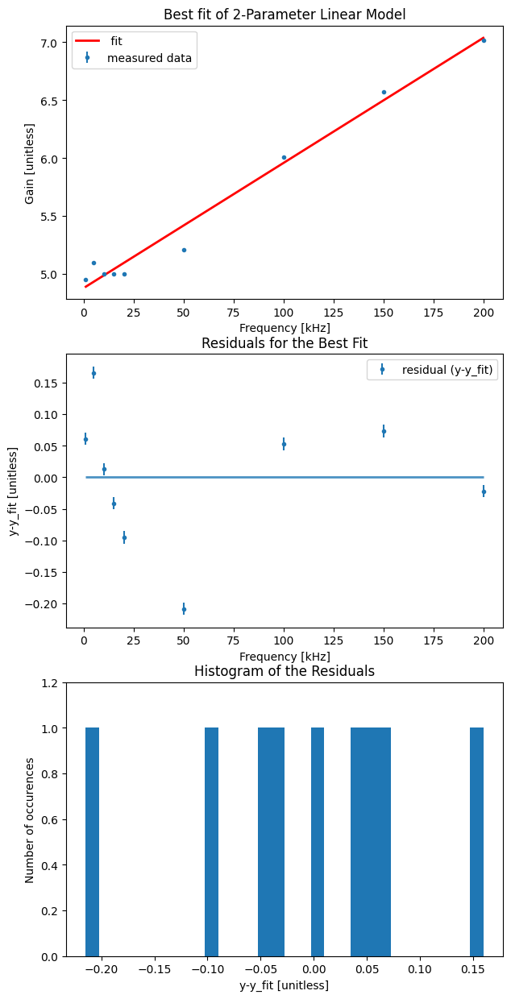

In [25]:
# The script below fits to a sine wave, but can be modified for other functions
# First, we load some python packages
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

################################################
# LIST OF ALL INPUTS
################################################

# fname is assumed to be in a four-column .csv file (comma separated values). The first two rows are
# assumed to be headers, like those produced in our code for packing oscilloscope data.
# The four columns are x-values, x-uncertainties, y-values, y-uncertainties.
# The .csv file must be in the same
# folder as this fit program, otherwise the full file extension must be added
# to fname: e.g. fname = 'folder/subfolder/subsubfolder/file.csv'

fname = "data_freq.csv"

x_name = "Frequency"
x_units = "kHz"
y_name = "Gain"
y_units = "unitless"

# The model you will fit to is defined below, in this case a sine wave.
# The parameters in the model are amplitude, freqency, and phase.
# To get a least squares fitting process started, it is necessary to provide good
# initial guesses for the parameters. From your plots of the data so far, you can make good guesses at these parameters.

param_names = ["slope", "intercept"]


# definition of the fit function
# def fit_function(x, amplitude,tau):

# fit function is a linear model with slope and intercept

def fit_function(x, slope, intercept):
    return x*slope + intercept

# load the file "fname", defined above; 
# if you have file with more than 4 columns, you may need to select different indicies for "usecols" (starting counting at 0)

data = np.loadtxt(fname, delimiter=",", comments="#", usecols=(0, 1, 2, 3), skiprows=1)

################################################
# READ IN DATA COLUMNS
################################################

# Here is where you access the data columns.
# You may need to alter these to choose what is on the y-axis and what is on the x-axis.

x = data[:, 0]
y = data[:, 2]
y_sigma = data[:, 3]

# calculate the best fit slope - this is the analytical solution for a 2-parameter fit to a striaght line
Delta = sum(1/y_sigma**2)*sum((x/y_sigma)**2) - (sum(x/y_sigma**2)**2)
m = (sum(1/y_sigma**2)*sum(x*y/y_sigma**2) - sum(x/y_sigma**2)*sum(y/y_sigma**2))/Delta

# calculate uncertainty of the best fit slope
m_sigma = np.sqrt(sum(1/y_sigma**2)/Delta)

print ("Slope is", m, "+/-", m_sigma)

# calculate the best fit intercept
b = (sum((x/y_sigma)**2)*sum(y/y_sigma**2) - sum(x/y_sigma**2)*sum(x*y/y_sigma**2))/Delta

# calculate uncertainty of the best fit intercept
b_sigma = np.sqrt(sum((x/y_sigma)**2)/Delta)
                        
print ("Intercept is", b, "+/-", b_sigma)
###############################################################################
# calculates and prints the chi-squared, degrees of freedon, and weighted chi-squared
###############################################################################

# function that  calculates the chi square value of a fit
def chi_square (param1, param2, x, y, sigma):
#
    return np.sum((y-fit_function(x, param1, param2))**2/sigma**2)
    
# calculate and print chi square as well as the per degree-of-freedom value
chi2 = chi_square(m,b,x,y,y_sigma)
# degrees of freedom is the number of data points minus the number of parameters
dof = len(x) - 2
print ("\nGoodness of fit - Chi-squared measure:")
print ("degrees of freedom = {}, Chi2/dof = {}\n".format(dof, chi2/dof))


# residual is the difference between the data and model
x_fitfunc = np.linspace(min(x), max(x), 500)
y_fitfunc = fit_function(x_fitfunc, m ,b)
y_fit = fit_function(x, m,b)
residual = y-y_fit
# creates a histogram of the residuals
hist,bins = np.histogram(residual,bins=30)

fig = plt.figure(figsize=(7,15))

ax1 = fig.add_subplot(311)
ax1.errorbar(x,y,yerr=y_sigma,marker='.',linestyle='',label="measured data")
ax1.plot(x_fitfunc,y_fitfunc,marker="",linestyle="-",linewidth=2,color="r",
         label=" fit")
# add axis labels and title
ax1.set_xlabel('{} [{}]'.format(x_name,x_units))
ax1.set_ylabel('{} [{}]'.format(y_name,y_units))
ax1.set_title('Best fit of 2-Parameter Linear Model')
# set the x and y boundaries of your plot
#plt.xlim(lower_x,upper_x)
#plt.ylim(lower_y,upper_y)
# show a legend. loc='best' places legend where least amount of data is 
# obstructed. 
ax1.legend(loc='best',numpoints=1)


# this code produces a figure with a plot of the residuals as well
# as a histogram of the residuals. 
# fig = plt.figure(figsize=(7,10))
ax2 = fig.add_subplot(312)
ax2.errorbar(x,residual,yerr=y_sigma,marker='.',linestyle='',
             label="residual (y-y_fit)")
ax2.hlines(0,np.min(x),np.max(x),lw=2,alpha=0.8)
ax2.set_xlabel('{} [{}]'.format(x_name,x_units))
ax2.set_ylabel('y-y_fit [{}]'.format(y_units))
ax2.set_title('Residuals for the Best Fit')
ax2.legend(loc='best',numpoints=1)
ax3 = fig.add_subplot(313)
ax3.bar(bins[:-1],hist,width=bins[1]-bins[0])

ax3.set_ylim(0,1.2*np.max(hist))
ax3.set_xlabel('y-y_fit [{}]'.format(y_units))
ax3.set_ylabel('Number of occurences')
ax3.set_title('Histogram of the Residuals')

"""
Modify the following lines to change the name of the file used to store a JPEG of your best fit graphs
"""

# Before showing the plot, you can also save a copy of the figure as a JPEG.
# The order is important here because plt.show clears the plot information after displaying it. 
plt.savefig('FittingResults.jpeg')
plt.show()

### Analysis of gain vs freq graph
- The line is not a constant line, as expected
- As the frequency increases, the gain changes. But the good thing is that in the audible range, the gain is constant
- There is a point in the graph (I think the gain measured at 5kHz freq) that is in the audible range, but the gain is weird. I think this is an error in data collection.
- But other than that, the graph looks as expected. For a certain frequency range, 1kHz-30kHz, the gain is constant.
- At and after 50 kHz, the gain starts changing. We don't have enough data points between 30 and 50 kHz due to time constraint
- Here, the chi-square and slope is irrelevnat, because we just have to prove our point that the gain changes with frequency

### DC Offset, Screenshots
- When we connect the capacitor, then adding the dc voltage does not cause any change, as in the amplified signal is not cutoff/distorted
- At 500 and 900 mV, there is no difference
- However, when we remove the capacitor, the amplified signal cuts off at 770 mV
- At 500 mV, there is not distortion, but at 900, the distortion is pretty significant. At 770mV, the signal just starts distorting. 

#### 500 mV offset, with capacitor
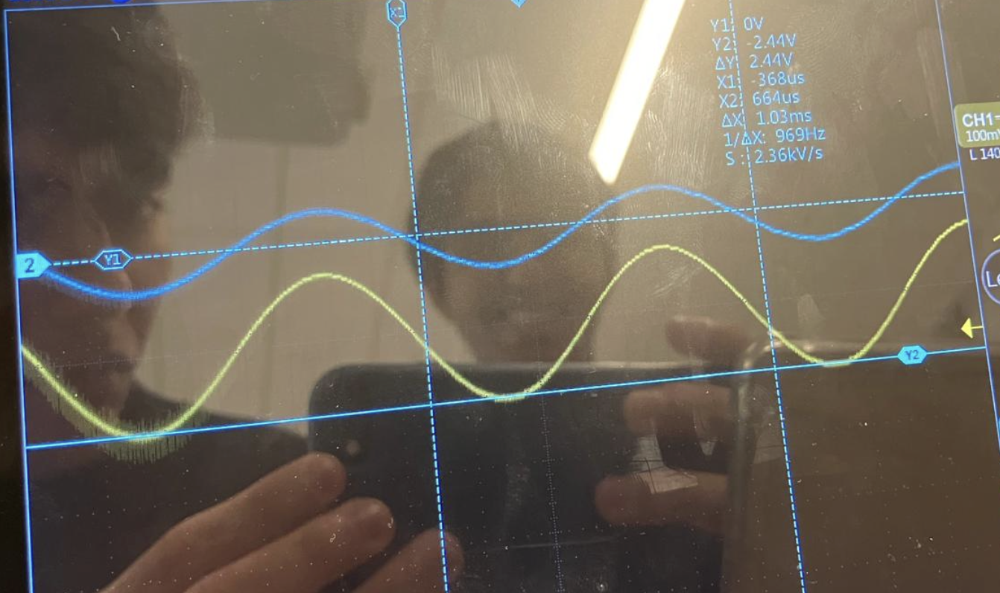

#### 900 mV offset, with capacitor
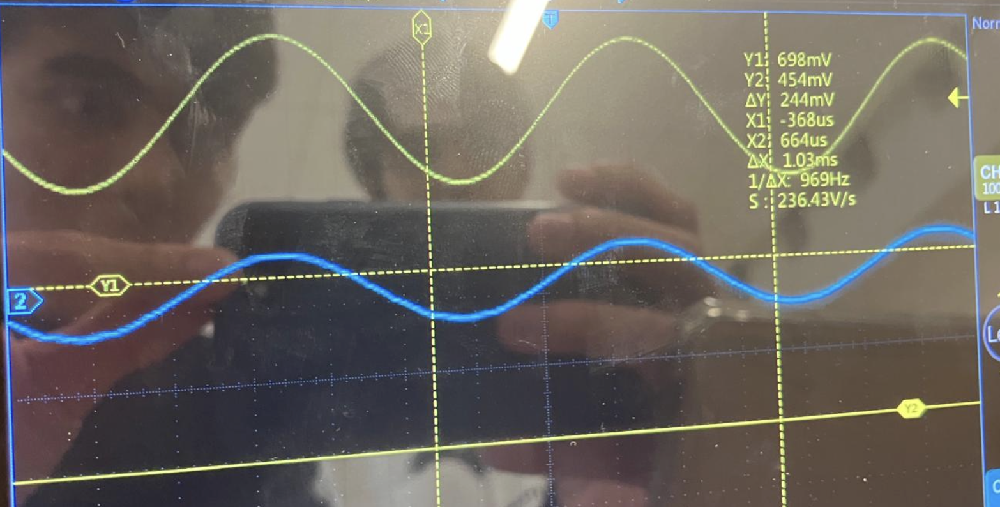

#### 500 mV offset, without capacitor
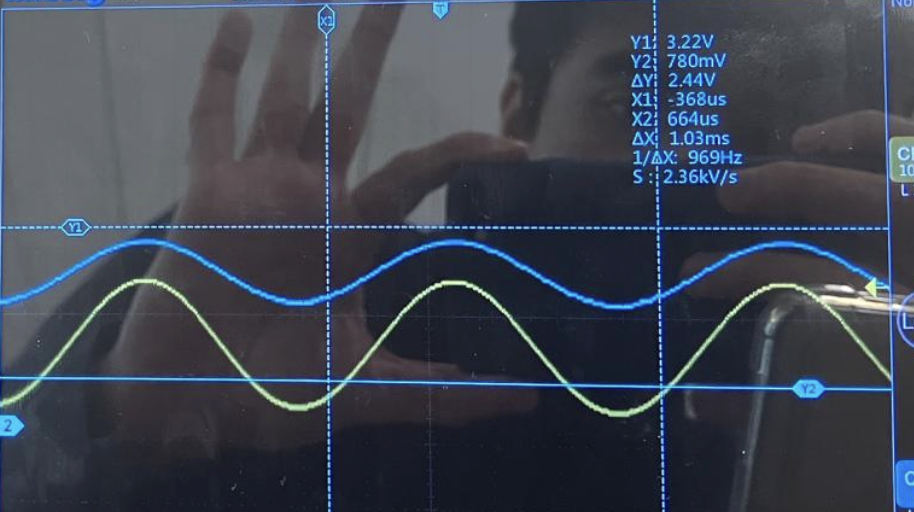

#### 900 mV offset, without capacitor
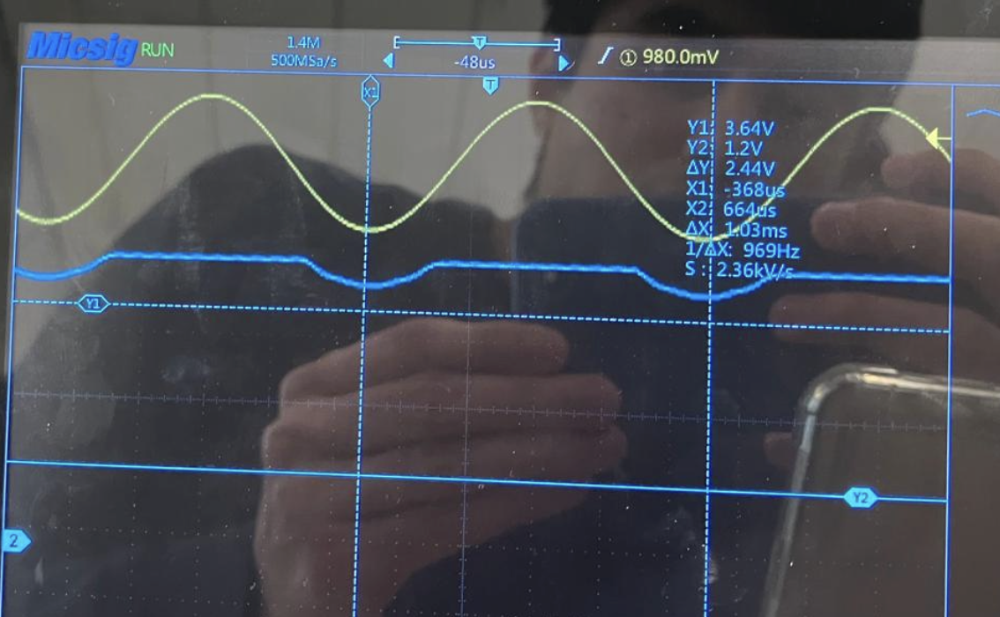

#### 770 mV offset, without capacitor
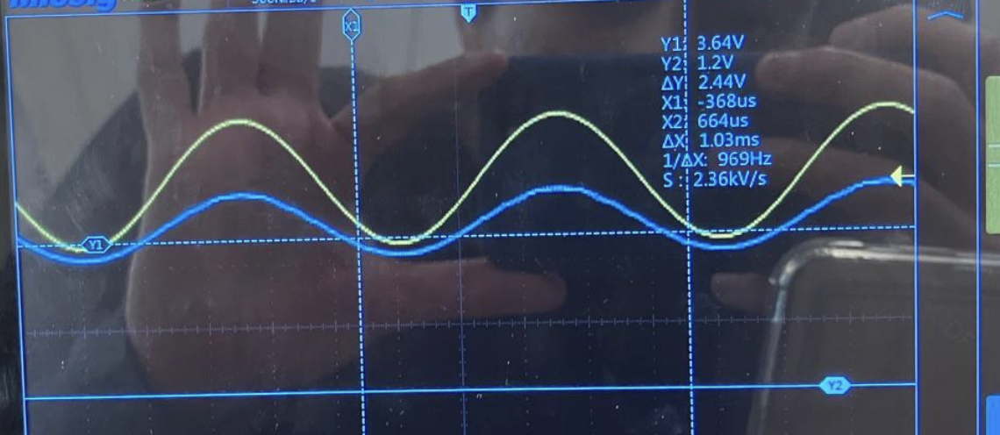

### Part-2: demodulator

- Date: 19 nov 2024, 2 pm
- First, we will collect all the three required components (Ge diode, 100k resistor, 0.5nf capacitor)
- Then, we will take the dmm measurements

- The 100kOhms resistor is: $98.6$ kOhms
- The 0.5nf capacitor is:  0.487 nF
- The knee voltage of Ge diode is: $0.295$ Volts
- Then, we got some short wires, to make sure that the circuit is nice and neat
- Cutting the wire short is harder than we thought. Its like, hard to put the short wire in the breadboard
- So, we changed our strategy. Now, we will connect one leg of the capacitor in the same potential as the capacitor, and the other leg is grounded with a wire.
- We need to connect the the input to the "left side of the diode", however we are confused as to where to connect the wires to the other side, well it goes to ground, we just figured out
- NOw, we are setting the wave functino generator's setting by setting the frequency to 690 kHz
- we were confused by a silly thing. We thoguht that "ampliefie and flitered" is differwent from "ampliefed", but actually, they are the same thing, if we look at the diagram.
- To measure the offset: set one of the cursorst to zero (for blue channel) and the other cursor to the middle of the sine wave, becuase that is the offset for a perfect sine wave, however we have a "rectified sine", so its approximately the same
- The offset: 54 millivolts  \pm 1mV
- The modulation amplitude: 85 millivots \pm 1 mV
- The modulation frequency: 6.9 kHz \pm 0.04, measured using cursor in oscilloscope
- The input signal amplitude is: $500 mV \pm 2 mV$
- The input signal frequency: $6.9 kHz \pm 0.04$
- This makes sense, the amplitude is modulated, but the frequency is not.

- after making the changes, there is no difference!
- Basically, removing or adding the capacitor does not affect the signal that we see in the oscilloscpe
- According to another lab group, they saw a chainge in the amplifed signal's wavefom? it becaame more "wiggly"
- However, we didn't see any change.
- Then, I asked a prof, and they said that perhaps the instructions are "redundant", ie, we are not suppsoed to remove the capacitor
- So, we move on the next part
- Oh noes, we don't. Thats not it. We are not supposed to "just remove the capacitor"
- We need to meaure the output as "after the capacitor", like the "220 uF" capacitor (see the circuit diagram given in instructions"
- The amplitude and frequency of the input signal is the same (ofc, because we are measureing the same "input")
- But the amplitude of the output is now $416 mV \pm 4$, whereas our input is $500 mV$, hence in this case, the amplitude is not very "modulated", there is not much of a modulation
- The frequency of the output signal is $6.85 \pm 0.02$kHz (which is the same as last time)
- So, the amplitude did change
- And, the offset is zero (measured using the same way as the last time)

## Tank Circuit
First, we will collect all the required components, and then we will do the dmm measuremnt:
- Inductor is: $445 uH$ (not measured by the dmm)
- capacitor is: $10.77 nF$
- The resisotr: $0.997 MOhms$ (the 1 MOhms resistor)
- The max resistance is $10.04$ kilo Ohms

## Tank Circuit
First, we will collect all the required components, and then we will do the dmm measuremnt:
- Inductor is: $445 uH$ (not measured by the dmm)
- capacitor is: $10.77 nF$
- The resisotr: $0.997 MOhms$ (the 1 MOhms resistor)
- The max resistance is $10.04$ kilo Ohms
- $0.657$ Volts is the knee voltage

### Building the circuit
- We found the correct polatrity for the varactor, by using the dmm, and connected is in a "backward bias" direction from the 0.01uF capactor to the ground direction.
- Then we connected the variable capacitor, one end to ground, the other to 5Volts
- Then, we connected the 1MOhms resistor to the middle leg of the 10kOhms variable resistor
- Finally, we connected the 471uF in parallel with the varactor and the 0.01uF capacitor
- Making the circuit was straightforward, but cutting the wires and stuff, and putting the wire in
- sigh
- we finally made all the connections

## 26 Nov 2024

### Building the tank circuit 
- There is a lot of noise in the input signal, which is weird, considering that our input is correctly connected
- To debug, we discussed what "triggering" actually means with our TA. Perhaps, there is so much noise because we are triggering at the wrong level? Hence, the signal passes the trigger level lots of times, creating this noise like thing
- We changed the oscilloscope to "channel-2" and, we also decided to use some other function generator.
- Our best guess is that the function generator was causing the problem
- Then, we changed the depth from our function generator too, because our "amplitude modulated signal" was going to zero in the minimum case
- We changed the oscilloscope, and now our signal looks good.
- Conclusion: the problem was with both the function generator and the oscilloscope. Right now, the input signal looks just like it is supposed to

### Debugging the "output signal not changing problem"
- Now, the signal looks good, but the amplitude of the output signal is not changing when we change the voltage across the varactor (we are building the varactor circuit)
- To debug this problem, we first use the "DMM-measurer-thingy" across the middle leg and the corner leg of the variable resistor, and yes, the voltage drop does change when we rotate the screw
- Changing the variable resistor is supposed to change the voltage drop across the varactor, and we confirm this by using the DMM measurer across the varactor. And it is changing, as expected. 
- So, if the voltage is changing, why is it that the amplitude in the oscilloscpe is not changing?
- it turns out that we are missing the ground connection from the inductor to ground
- But even after that connection, the amplitude is still not changing
- Now, we replace the inductor with another
- Wait actually, I said that our inductor wasn't grounded. I was wrong, it was grounded (in a weird fashion, as in, it was grounded with 4 wire connections)

Finally, we also changed some "really short wires" from our circuit, perhaps they were not connecting to the breadboard? 
- Conclusion: I am not entirely sure what fixed the problem. After we replaced the short wires, the output signal was gone. Then, we changed the settings of oscilloscope to get the signal.
- My best guess: the problem was with connection not being proper. (Thanks to Prof Andreas for catching this)

### Analyzing the oscilloscope signal
- some fluctions are visible in the input. This is high freq noise because it feels like the wave is tring to move horizontally, but its not able to (this shows that the noise is indeed high-freq)
- In the output, there is a low frequency noise to, because the sine curve is "wiggly", and it is fluctuating "up and down", instead of fluctuating "horizontally". This could happen if you have multipe grounds. We are using two grouds (on both sides of the breadboard)
- We observe the max amplitude to be $34mV \pm 0.5$peak to peak
- The variable voltage is set to the max, and that is $4.7 \pm 0.1$ volts. This is where we get the maximum amplitude
- The output signal has like a thick bar, which we can use as our uncertainty
- resistance of the inductor is $0.65 \pm 0.01$ Ohms

In [26]:
import numpy as np
import array
import pandas as pd
import matplotlib.pyplot as plt
import data_entry2

# freq = np.array([6.8, 6.94, 6.79, 6.74, 6.87, 6.58, 6.09, 7.09])  # kHz
u_freq = np.array([0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04]) #kHz

# v_out = np.array([35.6, 42, 35.2, 30.4, 39.2, 24.8, 9.4, 39]) # mV
u_vout = np.array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]) # mV

# freq = np.array([7.04, 6.99, 6.90, 6.85, 6.78, 6.83, 6.89])  # kHz
# v_out = np.array([3.04, 3.04, 3.96, 4.88, 6.08, 4.36, 3.31]) # mV

freq = np.array([750, 800, 850, 900, 730, 700, 690, 650, 600, 950])  # kHz
v_out = np.array([5.88, 5.28, 3.24, 2.14, 4.96, 3.92, 3.04, 1.96, 1.16, 1.44]) # mV


# Create a dictionary where keys are column names and values are the arrays
data = {
    'freq': freq,
    'u_freq': u_freq,
    'v_out': v_out,
    'u_vout': u_vout
}

# Convert the dictionary into a Pandas DataFrame
df = pd.DataFrame(data)

# Save the DataFrame to a CSV file
df.to_csv('freq and amplitude.csv', index=False)  # Set index=False to avoid adding an index column

print("CSV file created!")

CSV file created!


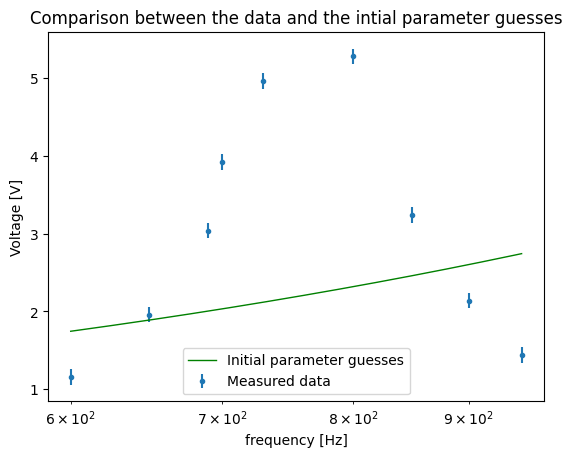

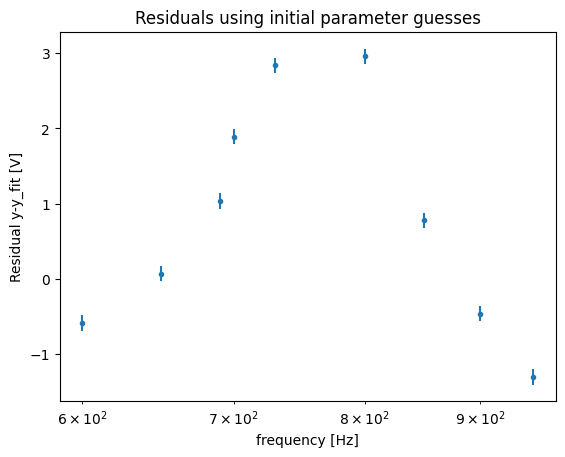

Chi-squared =  6.098789130273706

Fit parameters:
   f0 = 7.658e+02 ± 9.375e-01
   Vin = 6.825e+00 ± 2.161e-01
   gamma = -5.146e+02 ± 2.588e+01




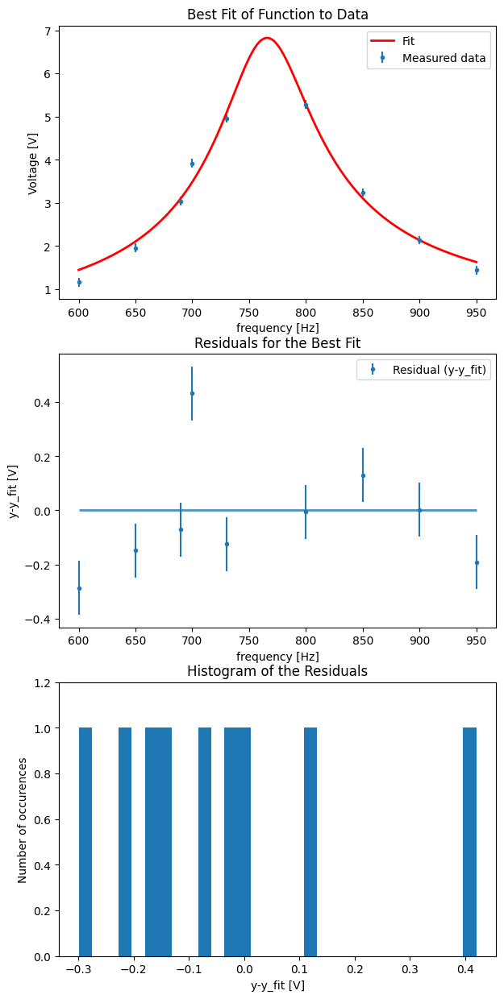

In [27]:
#code from experiment 4
# Load python packages
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

###############################################################################
# DEFINED FITTING FUNCTIONS
###############################################################################

def sine_func(x, amplitude, freq, phase):
    return amplitude * np.sin(2.0 * np.pi * freq * x + phase)

def offset_sine_func(x, amplitude, freq, phase, offset):
    return (amplitude * np.sin(2.0 * np.pi * freq * x + phase)) + offset

def exponential_func(x, amplitude, tau, voffset):
    return amplitude * np.exp(x/(-1.0*tau)) + voffset

def ringdown_function(x, amplitude, tau, resonantf, phase):
    return amplitude * np.exp(-x/tau) * np.cos(2.0*np.pi * resonantf * x + phase)

def linear_func(x, slope, intercept):
    return slope * x + intercept

def RCresp_func(x, tau, V0, voffset):
    return V0/np.sqrt(1+(2*np.pi*tau*x)**2) + voffset

def LRCresp_func(x, f0, Vin, gamma):
    return Vin/(np.sqrt(1+(2*np.pi/(gamma*x))**2*(x**2-f0**2)**2))

###############################################################################
# LIST OF ALL INPUTS
###############################################################################

# Name of the data file
fname = "freq and amplitude.csv"

# Names and units of data columns from fname
x_name = "frequency"
x_units = "Hz"
y_name = "Voltage"
y_units = "V"

# Modify to change the fitting function, parameter names and to set initial parameter guesses
fit_function = LRCresp_func
param_names = ("f0", "Vin", "gamma")
guesses = (5000,9,51000) #started guessing by using the formula for gamma and f_0 from prelab
# 1520, 

# Flags for optional features
show_covariance_matrix = False
set_xy_boundaries = False
lower_x = -0.01 # these values ignored if set_xy_boundaries = False
upper_x = 0.01
lower_y = -1
upper_y = 1

###############################################################################
# LOAD DATA
###############################################################################

# load the file fname and skip the first 'skiprows' rows
data = np.loadtxt(fname, delimiter=",", comments="#", usecols=(0, 1, 2, 3), skiprows=2)

# Assign the data file columns to variables for later use
x = data[:, 0]
y = data[:, 2]
y_sigma = data[:, 3]

###############################################################################
# INITIAL PLOT OF THE DATA
###############################################################################

# Define 500 points spanning the range of the x-data; for plotting smooth curves
xtheory = np.linspace(min(x), max(x), 500)

# Compare the guessed curve to the data for visual reference
y_guess = fit_function(xtheory, *guesses)
plt.errorbar(x, y, yerr=y_sigma, marker=".", linestyle="", label="Measured data")
plt.plot(
    xtheory,
    y_guess,
    marker="",
    linestyle="-",
    linewidth=1,
    color="g",
    label="Initial parameter guesses",
)
plt.xlabel(f"{x_name} [{x_units}]")
plt.ylabel(f"{y_name} [{y_units}]")
plt.title(r"Comparison between the data and the intial parameter guesses")
plt.legend(loc="best", numpoints=1)
plt.xscale("log")
plt.show()

# calculate the value of the model at each of the x-values of the data set
y_fit = fit_function(x, *guesses)

# Residuals are the difference between the data and theory
residual = y - y_fit

# Plot the residuals
plt.errorbar(x, residual, yerr=y_sigma, marker=".", linestyle="", label="residuals")
plt.xlabel(f"{x_name} [{x_units}]")
plt.ylabel(f"Residual y-y_fit [{y_units}]")
plt.title("Residuals using initial parameter guesses")
plt.xscale("log")
plt.show()

###############################################################################
# PERFORM THE FIT AND PRINT RESULTS
###############################################################################

# Use curve_fit to perform the fit
# fit_function: defined above to choose a specific fitting function 
# fit_params: holds the resulting fit parameters
# fit_cov: the covariance matrix between all the parameters
#          (used to extract fitting parameter uncertanties)
# maxfev=10**5: maximum number of fitting procedure iterations before giving up
# absolute_sigma=True: uncertainties are treated as absolute (not relative)
fit_params, fit_cov = curve_fit(
    fit_function, x, y, sigma=y_sigma, 
    p0=guesses,absolute_sigma=True, maxfev=10**5)

# Define the function that calculates chi-squared
def chi_square(fit_parameters, x, y, sigma):
    dof = len(x) - len(fit_params)
    return np.sum((y - fit_function(x, *fit_parameters)) ** 2 / sigma**2)/dof

# Calculate and print reduced chi-squared
chi2 = chi_square(fit_params, x, y, y_sigma)
print("Chi-squared = ", chi2)

# Calculate the uncertainties in the fit parameters
fit_params_error = np.sqrt(np.diag(fit_cov))

# Print the fit parameters with uncertianties
print("\nFit parameters:")
for i in range(len(fit_params)):
    print(f"   {param_names[i]} = {fit_params[i]:.3e} ± {fit_params_error[i]:.3e}")
print("\n")

# (Optional) Print the covariance between all variables
if show_covariance_matrix:
    print("Covariance between fit parameters:")
    for i, fit_covariance in enumerate(fit_cov):
        for j in range(i+1,len(fit_covariance)):
            print(f"   {param_names[i]} and {param_names[j]}: {fit_cov[i,j]:.3e}")
    print("\n")

# residual is the difference between the data and model
x_fitfunc = np.linspace(min(x), max(x), 500)
y_fitfunc = fit_function(x_fitfunc, *fit_params)
y_fit = fit_function(x, *fit_params)
residual = y-y_fit

###############################################################################
# PRODUCE A MULTIPANEL PLOT, WITH SCATTER PLOT, RESIDUALS AND RESIDUALS HISTOGRAM
###############################################################################

# The size of the canvas
fig = plt.figure(figsize=(7,15))

# The scatter plot
ax1 = fig.add_subplot(311)
ax1.errorbar(x,y,yerr=y_sigma,marker='.',linestyle='',label="Measured data")
ax1.plot(x_fitfunc, y_fitfunc, marker="", linestyle="-", linewidth=2,color="r", label="Fit")
ax1.set_xlabel(f"{x_name} [{x_units}]")
ax1.set_ylabel(f"{y_name} [{y_units}]")
ax1.set_title('Best Fit of Function to Data')

# (Optional) set the x and y boundaries of your plot
if set_xy_boundaries:
    plt.xlim(lower_x,upper_x)
    plt.ylim(lower_y,upper_y)
# Show the legend. loc='best' places it where the date are least obstructed
ax1.legend(loc='best',numpoints=1)

# The residuals plot
ax2 = fig.add_subplot(312)
ax2.errorbar(x, residual, yerr=y_sigma,marker='.', linestyle='', label="Residual (y-y_fit)")
ax2.hlines(0,np.min(x),np.max(x),lw=2,alpha=0.8)
ax2.set_xlabel(f"{x_name} [{x_units}]")
ax2.set_ylabel(f"y-y_fit [{y_units}]")
ax2.set_title('Residuals for the Best Fit')
ax2.legend(loc='best',numpoints=1)

# Histogram of the residuals
ax3 = fig.add_subplot(313)
hist,bins = np.histogram(residual,bins=30)
ax3.bar(bins[:-1],hist,width=bins[1]-bins[0])
ax3.set_ylim(0,1.2*np.max(hist))
ax3.set_xlabel(f"y-y_fit [{y_units}]")
ax3.set_ylabel('Number of occurences')
ax3.set_title('Histogram of the Residuals')

# Save a copy of the figure as a png 
plt.savefig('FittingResults.png')

# Show the plot
plt.show()

### Analysis of the fit
- Visually, the fit looks good
- The chi square is $6.1$, which is not too bad, so our fit is indeed good
- The residuals are mostly negative, so our model is somewhat overestimating the data
- Best fit params: $f0 = 765.8 \pm 0.9$, $Vin = 6.8 \pm 0.2$, $gamma = -514 \pm 25$
- The value of resistance according to the fit is arund $0.23$ Ohms, whereas the one calculated directly using DMM is $0.65 \pm 0.01$ Ohms. These values are not exact, but they are close. If our measurements were better, we could have gotten closer

### Problems encountered when collecting data
- when we increase the frequency in function generator, but we meauare the frequency using the oscilloscope, the frequency is less
- This is beacuase we are going out of the resonance region, so its not weird for this observation
- In simple words, we half left half of our curve, and we need data points beyond 690kHz, however regardless of whether we increase or decrese the frequency in function generator, we are not able to get a freq of higher than 690kHz
- So, how do we get our plot? 
- But finally, we figured out our mistake
- So, we were measuring the frequency using "vertical cursors" in the oscilloscope, and measuring the voltage using the "vertical cursors".
- The problem is: the freq shown in function generator, and the freq measured from oscilloscope were very different, and we decided to trust the oscilloscpe measurement (because we were told in previous labs that function generator can be unreliable)
- It turns out, that in this case, the best way is to just see the freq from the function generator.
- Then, our plot lookin' good

Intersting side note: we collected the final data point after we tested our radio stations. When we reconnected the circuit, there was no weird noise. LIke the signal was perfect. We have no idea why. Its like, just removing the connections and reconnecting somehow solved the problem. Weird

In [28]:
## measuring the resistance value from our fit 
L = 445e-6 # uH
gamma = 514
R = gamma * L
print(f"the value of R calculated: {R}")

the value of R calculated: 0.22873


### Final circuit/ tuning the radio
- When we first plugged our radio in, there was no noise, like not even a little
- It turns out one of our wires were loose
- Once we fixed that, we started tuning our circuit.
- Initially, we just heard static. Then, we tuned the circuit (we used a dmm measurer to make sure that we are increasing the voltage, because that will give the max amplitude of signal), and we could hear a bit some human like voice
- finally, after moving more in that direction, we could hear the signal properly. Victory!
- In the oscilloscope, the signal looks "constant" when it is not tuned to any radio, and we could see wave patterns when we are tuned to a particular radio]]

### How was the final circuit built?
- We just detached the circuit from our oscilloscope, then connected the speaker to the correct place, and then went to test our radio\

### Major pitfalls:
- using really short wires: because of this, even though our circuit looked correct, it was not! because the connections were missing!
- Making sure of the "Op Amp legs" are in the correct place
- In general, the problems that are "hard" to debug are the "major pitfalls"
- Not grounding the circuit componentes (that should be grounded) was also a problem
- Also, sometimes, the problem was with the instrument (oscilloscope/funciton generator) and the wires themselves